# Experimentos

In [1]:
import torch


In [2]:
def print_gpu_memory(prefix=""):
    if torch.cuda.is_available():
        allocated = torch.cuda.memory_allocated() / (1024 ** 2)
        reserved = torch.cuda.memory_reserved() / (1024 ** 2)
        print(f"{prefix} Memory Allocated: {allocated:.2f} MB")
        print(f"{prefix} Memory Reserved: {reserved:.2f} MB")
    else:
        print("CUDA is not available.")


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache() 

print_gpu_memory()

 Memory Allocated: 0.00 MB
 Memory Reserved: 0.00 MB


In [3]:
# imports

import os
import sys
sys.path.append(os.path.abspath('..'))

import src.models.unets as unets
import src.data.preprocess_data as data
import src.training.train_model as train
import src.models.hrnets as hrnets

from torch.utils.data import DataLoader



/home/jonathan/UrbanizedAreasSegmentation/.venv/lib/python3.10/site-packages/torch_lr_finder/lr_finder.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:

tiles = ['032027']#, '032026'] 
num_subtiles = 6
classes_mode = 'type'
training_batch_size = 16
model_types = 'hrnets'
model_types = 'unets'

if classes_mode == 'type':
    num_classes = 5
elif classes_mode == 'density':
    num_classes = 4
elif classes_mode == 'binary':
    num_classes = 2
elif classes_mode == 'all':
    num_classes = 9





In [5]:
unet_models_batch = {f'UNetSmall-64-{classes_mode}' : 16, #512,
                     f'UNetSmall-256-{classes_mode}' : 32,
                     f'UNet-64-{classes_mode}': 256,
                     f'UNet-256-{classes_mode}': 16,
                     f'UNetResNet34-224-{classes_mode}': 128, #ok
                     f'UNetEfficientNetB0-224-{classes_mode}': 64, 
                     f'UNetConvNext-224-{classes_mode}': 32,
                     f'HRNetW18-512-{classes_mode}': 4,
                     f'HRNetW32-512-{classes_mode}': 4,
                     f'HRNetW48-512-{classes_mode}': 4
}

In [6]:
if model_types == 'unets':
    model_param_grid = {

        #model params:
        
        'model' : [#f'UNetSmall-64-{classes_mode}',
                   f'UNetSmall-256-{classes_mode}',
                #f'UNet-256-{classes_mode}', #ok
                #f'UNet-64-{classes_mode}', #ok
                #f'UNetResNet34-224-{classes_mode}', #ok
                #f'UNetEfficientNetB0-224-{classes_mode}', 
                #f'UNetConvNext-224-{classes_mode}',
                ],
            
        #training params
            # loss
        'loss': ['CE'],#'CE-dice', 'dice'],#,'groups'],#, 'dice', 'CE-dice'],
        'weighted_loss': [True, False], #Wegted loss, +CE: bom recall pra 2, 3, 4, ruim resto
        'dist_loss':[True],
        'crf': [False],#[0.0001],    
        'epochs' : [15],
        'patience' : [3],
        'batch_size' : [training_batch_size],
        'data_augmentation' : [True],
        
    }

if model_types == 'hrnets':
    model_param_grid = {
        #model params:
        'model' : [
                #f'HRNetW18-1024-{classes_mode}',
                #f'HRNetW32-1024-{classes_mode}',
                #f'HRNetW48-1024-{classes_mode}'
                f'HRNetW18-512-{classes_mode}',
                f'HRNetW32-512-{classes_mode}',
                f'HRNetW48-512-{classes_mode}'
                ],
            
        #training params
            # loss
        'loss': ['dice'],#'CE', 'dice', 'BCE-dice'],
        'weighted_loss': [False, True],
        'epochs' : [20],
        'patience' : [4],
        'batch_size' : [training_batch_size],
        'data_augmentation' : [True],
        
    }



In [7]:

train_files, val_files, test_files = data.train_val_test_stratify(tiles, 
                                                                  num_subtiles,
                                                                    train_size = 0.6, 
                                                                    val_size = 0.2, 
                                                                    stratify_by = classes_mode)



Loading:  <function yaml_filename at 0x737e01020160>
File already saved, loading it.


--------------------
Training UNetSmall-256-type-dist-CEW
{'model': 'UNetSmall-256-type', 'loss': 'CE', 'weighted_loss': True, 'dist_loss': True, 'crf': False, 'epochs': 15, 'patience': 3, 'batch_size': 16, 'data_augmentation': True}
Loading:  <function yaml_filename at 0x737e01020160>
{'num_subtiles': 6, 'test_files': ['/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=8800_y=8800.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=0_y=1760.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=1760_y=0.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=5280_y=0.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=1760_y=7040.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-1

  0%|          | 0/848 [00:00<?, ?it/s]

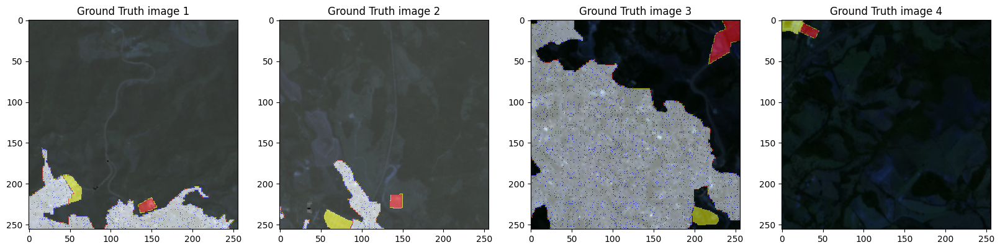

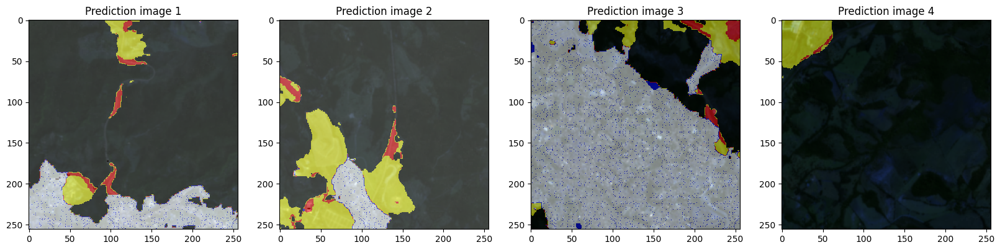

100%|██████████| 848/848 [05:59<00:00,  2.36it/s]


Train Loss: 0.9622231199469659, 0.9622231199469659, 0.8444595104752082
Train Accuracy: 0.9656389355659485
Train confusion matrix:


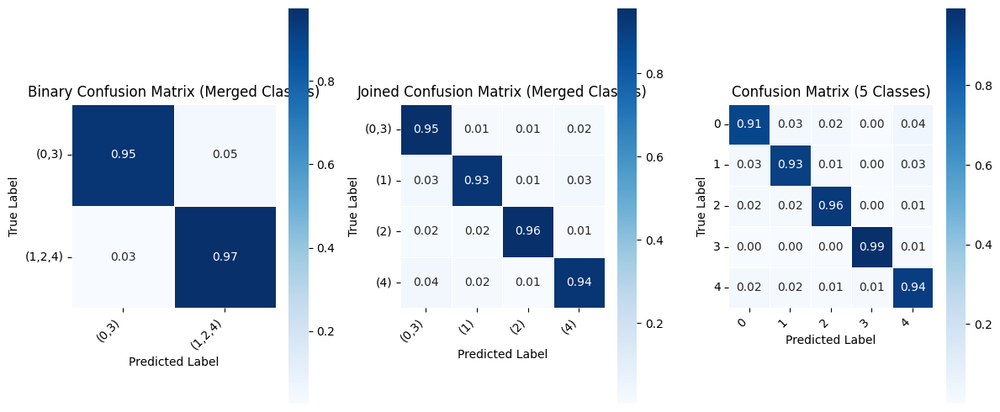

              precision    recall  f1-score    support           TP  \
Class 0        0.995405  0.908686  0.950071  745600064  677522112.0   
Class 1        0.116211  0.933515  0.206691    3140102    2931331.0   
Class 2        0.557918  0.955925  0.704601   24110136   23047464.0   
Class 3        0.549120  0.993259  0.707243    4915387    4882253.0   
Class 4        0.784329  0.937246  0.853996  111290936  104305936.0   
weighted avg   0.951546  0.914097  0.927419  889056640          0.0   
macro avg      0.600597  0.945726  0.684521  889056640          0.0   
micro avg      0.914097  0.914097  0.914097  889056640          0.0   

                      FP           TN          FN  
Class 0        3127246.0  140328224.0  68084432.0  
Class 1       22292892.0  863633600.0    208771.0  
Class 2       18262272.0  846695808.0   1062660.0  
Class 3        4008792.0  880139584.0     33134.0  
Class 4       28681620.0  749089728.0   6983833.0  
weighted avg         0.0          0.0         0.

  0%|          | 0/16 [00:00<?, ?it/s]

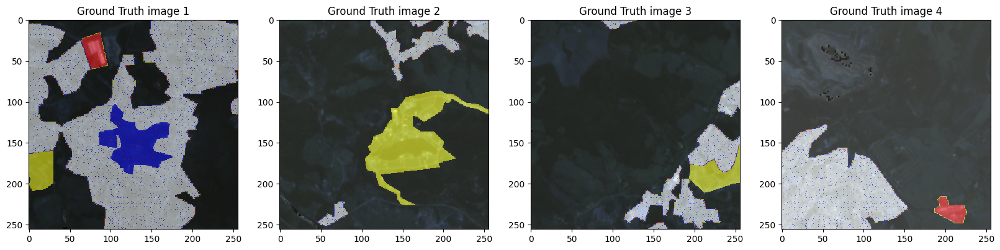

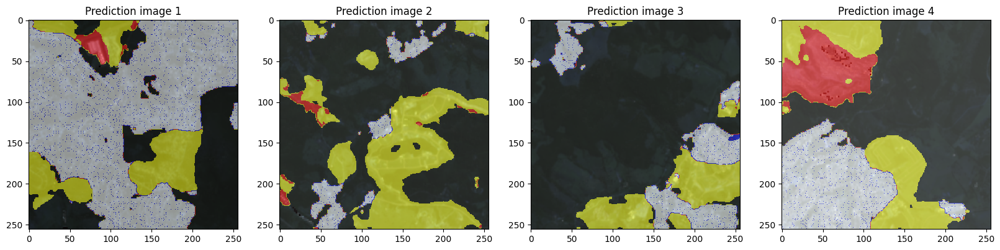

100%|██████████| 16/16 [00:04<00:00,  3.41it/s]


Val Loss: 1.170596785934604, 1.170596785934604, 0.8714880714611132
Val Accuracy: 0.9501277208328247
Val confusion matrix:


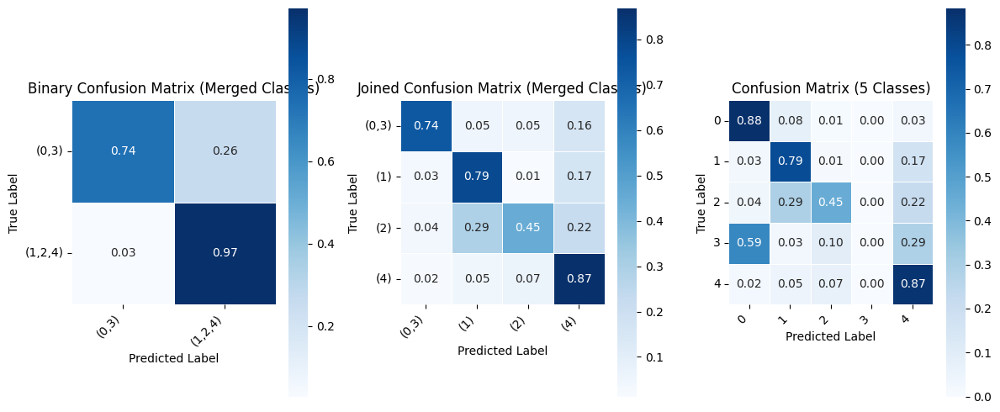

              precision    recall  f1-score   support          TP         FP  \
Class 0        0.991823  0.883093  0.934306  13012698  11491426.0    94734.0   
Class 1        0.043868  0.786745  0.083103     67159     52837.0  1151606.0   
Class 2        0.054070  0.449428  0.096528     41001     18427.0   322369.0   
Class 3        0.001864  0.000171  0.000314     64228        11.0     5891.0   
Class 4        0.853611  0.867818  0.860656   2871234   2491708.0   427311.0   
weighted avg   0.956788  0.875319  0.911700  16056320         0.0        0.0   
macro avg      0.389048  0.597451  0.394981  16056320         0.0        0.0   
micro avg      0.875319  0.875319  0.875319  16056320         0.0        0.0   

                      TN         FN  
Class 0        2948888.0  1521272.0  
Class 1       14837555.0    14322.0  
Class 2       15692950.0    22574.0  
Class 3       15986201.0    64217.0  
Class 4       12757775.0   379526.0  
weighted avg         0.0        0.0  
macro avg    

  0%|          | 0/848 [00:00<?, ?it/s]

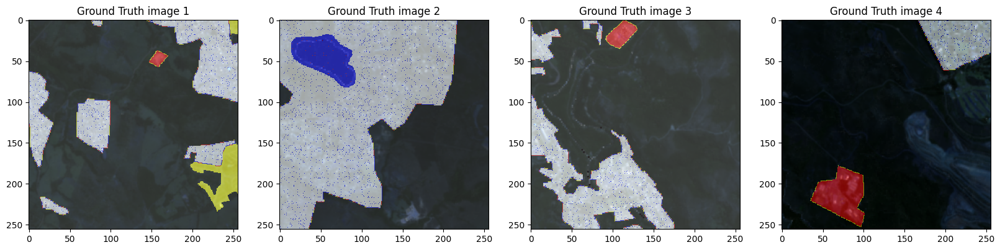

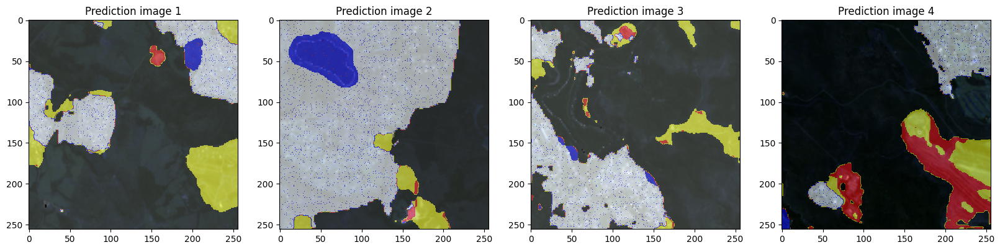

100%|██████████| 848/848 [05:56<00:00,  2.38it/s]


Train Loss: 0.9601593935329724, 0.9601593935329724, 0.8442166425143831
Train Accuracy: 0.9665847420692444
Train confusion matrix:


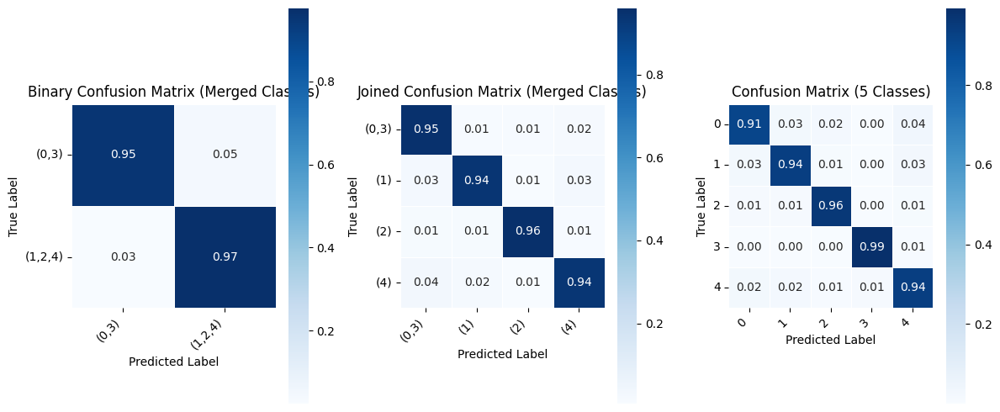

              precision    recall  f1-score    support           TP  \
Class 0        0.995534  0.911572  0.951705  745597440  679675776.0   
Class 1        0.118069  0.937595  0.209728    3140102    2944143.0   
Class 2        0.569017  0.959248  0.714311   24110144   23127564.0   
Class 3        0.558296  0.992435  0.714595    4915387    4878203.0   
Class 4        0.789024  0.936000  0.856251  111291048  104167616.0   
weighted avg   0.952600  0.916462  0.929387  889054144          0.0   
macro avg      0.605988  0.947370  0.689318  889054144          0.0   
micro avg      0.916462  0.916462  0.916462  889054144          0.0   

                      FP           TN          FN  
Class 0        3049156.0  140406784.0  65932396.0  
Class 1       21991620.0  863934464.0    195959.0  
Class 2       17517212.0  847436224.0    982525.0  
Class 3        3859458.0  880286464.0     37184.0  
Class 4       27853212.0  749920128.0   7122526.0  
weighted avg         0.0          0.0         0.

  0%|          | 0/16 [00:00<?, ?it/s]

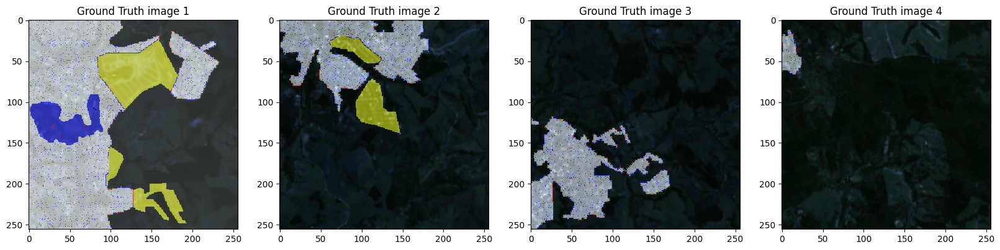

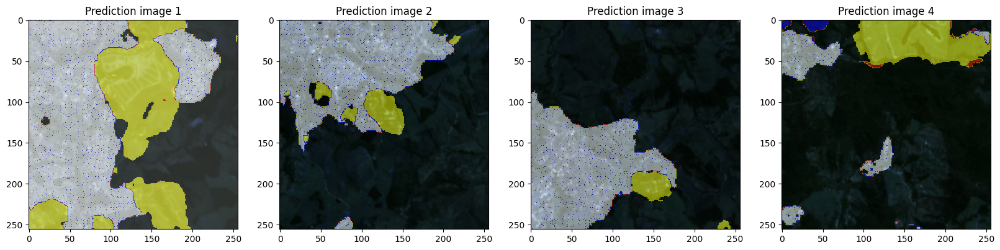

100%|██████████| 16/16 [00:04<00:00,  3.62it/s]


Val Loss: 1.2034210613795688, 1.2034210613795688, 0.8718680907268913
Val Accuracy: 0.9476484656333923
Val confusion matrix:


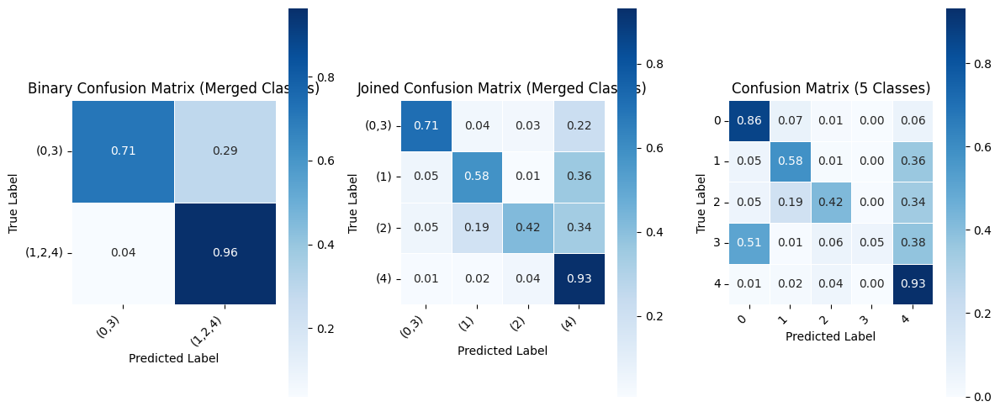

              precision    recall  f1-score   support          TP        FP  \
Class 0        0.993929  0.862279  0.923435  13012698  11220578.0   68538.0   
Class 1        0.039941  0.582870  0.074759     67159     39145.0  940926.0   
Class 2        0.058065  0.421234  0.102062     41001     17271.0  280169.0   
Class 3        0.112631  0.049854  0.069115     64228      3202.0   25227.0   
Class 4        0.772750  0.931548  0.844751   2871234   2674692.0  786572.0   
weighted avg   0.944472  0.869121  0.900300  16056320         0.0       0.0   
macro avg      0.395463  0.569557  0.402825  16056320         0.0       0.0   
micro avg      0.869121  0.869121  0.869121  16056320         0.0       0.0   

                      TN         FN  
Class 0        2975084.0  1792120.0  
Class 1       15048235.0    28014.0  
Class 2       15735150.0    23730.0  
Class 3       15966865.0    61026.0  
Class 4       12398514.0   196542.0  
weighted avg         0.0        0.0  
macro avg            0

  0%|          | 0/50 [00:00<?, ?it/s]

Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 5.03E-04


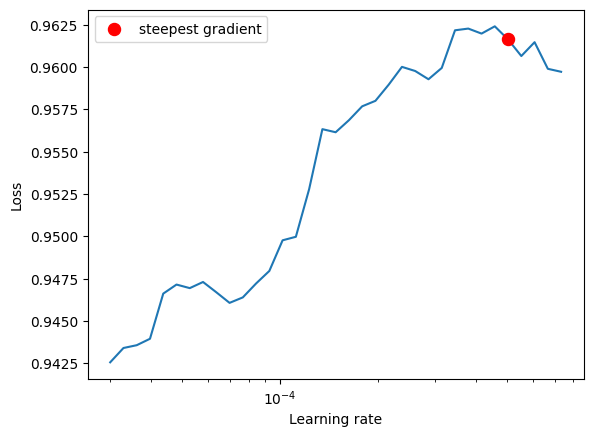

Chosen LR:  0.0005034045429371808
0.0011729083262381479
0.0005034045429371808
Novo LR
Novo LR
Plot saved to /home/jonathan/UrbanizedAreasSegmentation/experimental_results/loss_UNetSmall-256-type-dist-CEW.png
Novo LR
Novo LR
Plot saved to /home/jonathan/UrbanizedAreasSegmentation/experimental_results/accuracy_UNetSmall-256-type-dist-CEW.png
--------------------
Training UNetSmall-256-type-dist-CE
{'model': 'UNetSmall-256-type', 'loss': 'CE', 'weighted_loss': False, 'dist_loss': True, 'crf': False, 'epochs': 15, 'patience': 3, 'batch_size': 16, 'data_augmentation': True}
Loading:  <function yaml_filename at 0x737e01020160>
{'num_subtiles': 6, 'test_files': ['/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=8800_y=8800.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S2-16D_V2_032027_x=0_y=1760.tif', '/home/jonathan/UrbanizedAreasSegmentation/data/processed/S2-16D_V2_032027/6x6_subtiles/S

  0%|          | 0/100 [00:00<?, ?it/s]

Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 1.15E-03


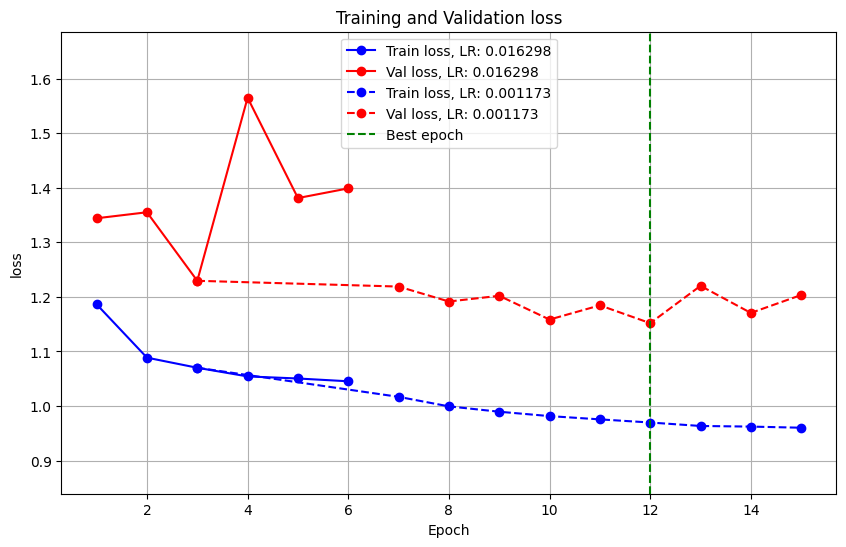

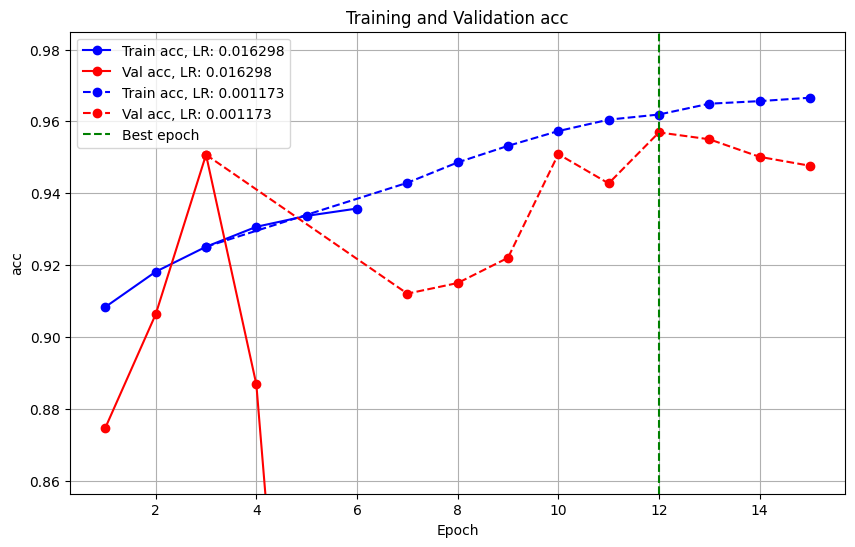

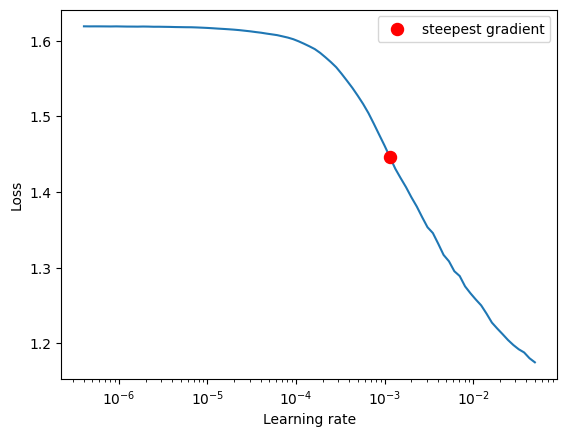

Chosen LR:  0.0011497569953977363
1e-07
0.0011497569953977363
--------------------------------
Training Epoch 1/15
running...


  0%|          | 0/848 [00:00<?, ?it/s]

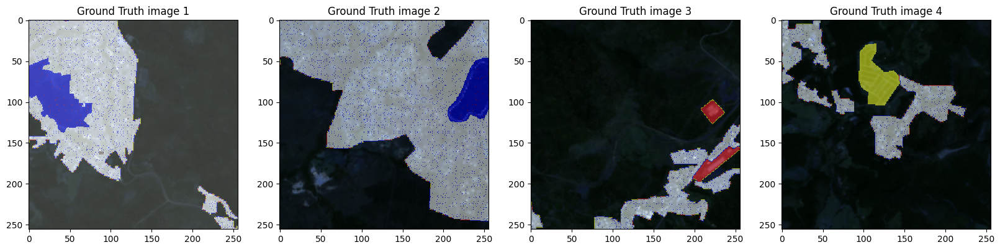

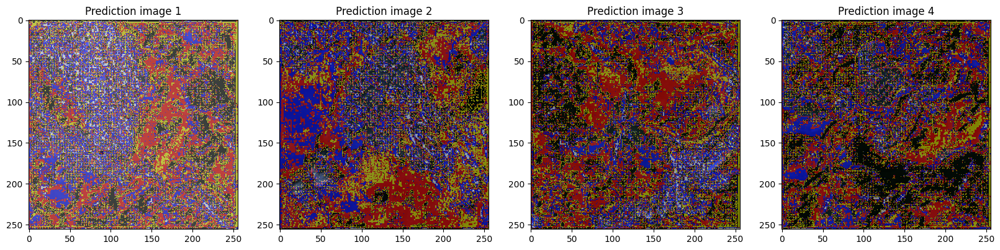

100%|██████████| 848/848 [05:54<00:00,  2.39it/s]


Train Loss: 0.9911337727803001, 0.9911337727803001, 0.8533299321729702
Train Accuracy: 0.9686449766159058
Train confusion matrix:


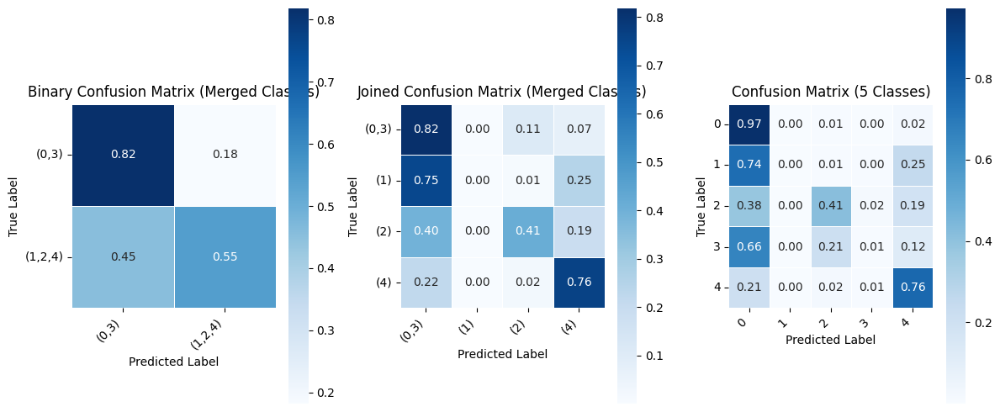

              precision    recall  f1-score    support           TP  \
Class 0        0.950008  0.971928  0.960843  745599936  724674176.0   
Class 1        0.001247  0.000101  0.000187    3140102        318.0   
Class 2        0.581557  0.414106  0.483751   24110170    9984145.0   
Class 3        0.012653  0.005337  0.007507    4915387      26231.0   
Class 4        0.793253  0.760933  0.776757  111290784   84684120.0   
weighted avg   0.911860  0.921612  0.916197  889056384          0.0   
macro avg      0.467743  0.430481  0.445809  889056384          0.0   
micro avg      0.921612  0.921613  0.921613  889056384          0.0   

                      FP           TN          FN  
Class 0       38134376.0  105321288.0  20930486.0  
Class 1         254644.0  885668672.0   3139784.0  
Class 2        7183811.0  857768832.0  14125960.0  
Class 3        2046949.0  882097984.0   4889156.0  
Class 4       22071430.0  755697472.0  26605784.0  
weighted avg         0.0          0.0         0.

  0%|          | 0/16 [00:00<?, ?it/s]

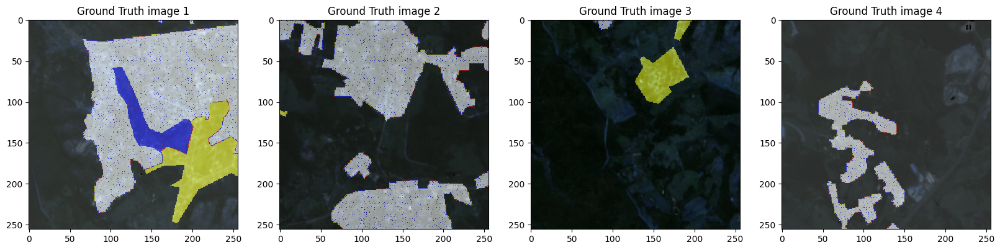

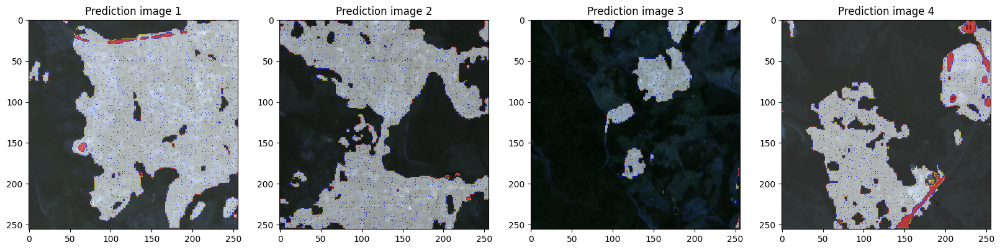

100%|██████████| 16/16 [00:05<00:00,  3.14it/s]


Val Loss: 0.985022572595246, 0.985022572595246, 0.8699012376824203
Val Accuracy: 0.9650394320487976
Val confusion matrix:


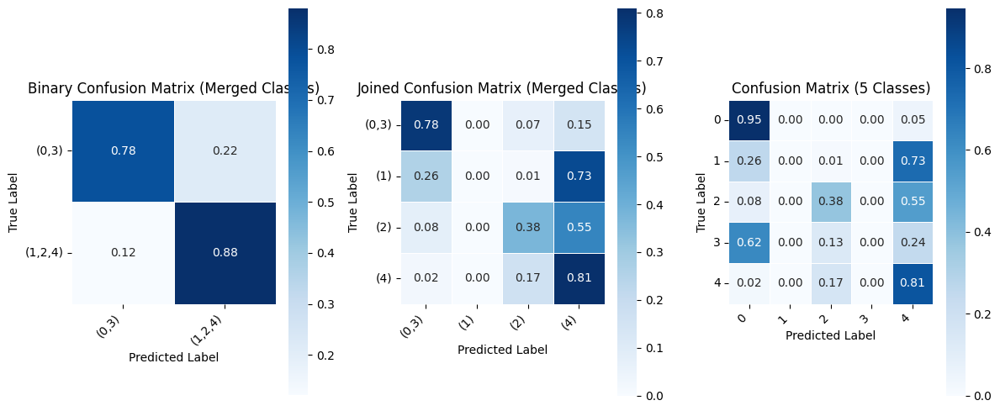

              precision    recall  f1-score   support          TP        FP  \
Class 0        0.989544  0.946220  0.967397  13012698  12312872.0  130107.0   
Class 1        0.000000  0.000000  0.000000     67159         0.0       0.0   
Class 2        0.028103  0.376186  0.052299     41001     15424.0  533412.0   
Class 3        0.000000  0.000000  0.000000     64228         0.0       0.0   
Class 4        0.758582  0.809644  0.783281   2871234   2324677.0  739828.0   
weighted avg   0.937690  0.912598  0.924220  16056320         0.0       0.0   
macro avg      0.355246  0.426410  0.360596  16056320         0.0       0.0   
micro avg      0.912598  0.912598  0.912598  16056320         0.0       0.0   

                      TN        FN  
Class 0        2913515.0  699826.0  
Class 1       15989161.0   67159.0  
Class 2       15481907.0   25577.0  
Class 3       15992092.0   64228.0  
Class 4       12445258.0  546557.0  
weighted avg         0.0       0.0  
macro avg            0.0     

  0%|          | 0/848 [00:00<?, ?it/s]

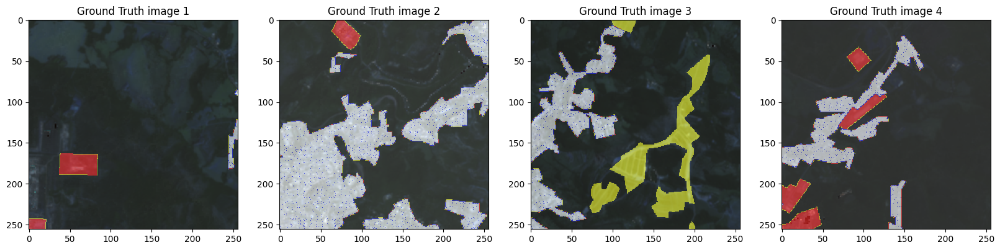

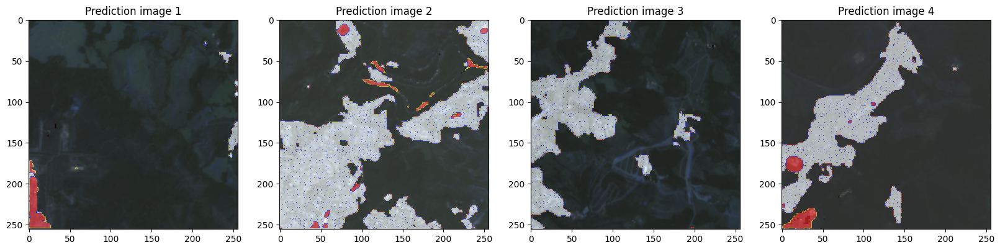

100%|██████████| 848/848 [06:02<00:00,  2.34it/s]


Train Loss: 0.9520099816922679, 0.9520099816922679, 0.8476945418410292
Train Accuracy: 0.9807312488555908
Train confusion matrix:


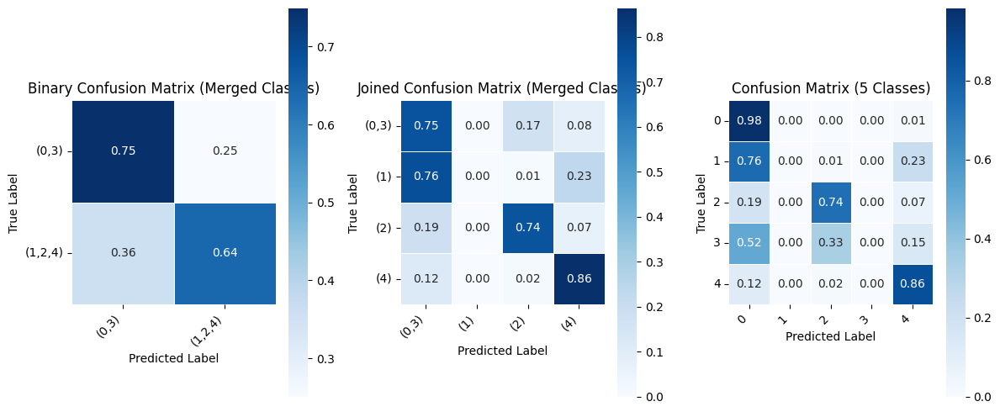

              precision    recall  f1-score    support           TP  \
Class 0        0.969645  0.982066  0.975816  745598528  732233408.0   
Class 1        0.000000  0.000000  0.000000    3140102          0.0   
Class 2        0.750074  0.744042  0.747046   24110132   17938932.0   
Class 3        0.000000  0.000000  0.000000    4915387          0.0   
Class 4        0.873368  0.863152  0.868230  111290736   96060160.0   
weighted avg   0.942853  0.951828  0.947303  889054912          0.0   
macro avg      0.518618  0.517852  0.518218  889054912          0.0   
micro avg      0.951828  0.951828  0.951828  889054912          0.0   

                      FP           TN          FN  
Class 0       22922688.0  120532904.0  13371471.0  
Class 1              0.0  885924416.0   3140102.0  
Class 2        5977274.0  858974720.0   6171177.0  
Class 3              0.0  884145088.0   4915387.0  
Class 4       13927998.0  763844544.0  15229819.0  
weighted avg         0.0          0.0         0.

  0%|          | 0/16 [00:00<?, ?it/s]

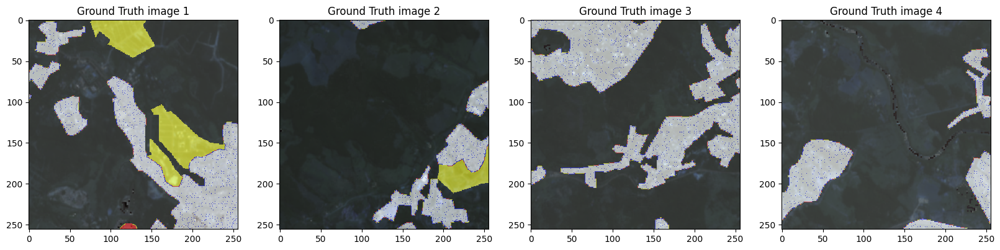

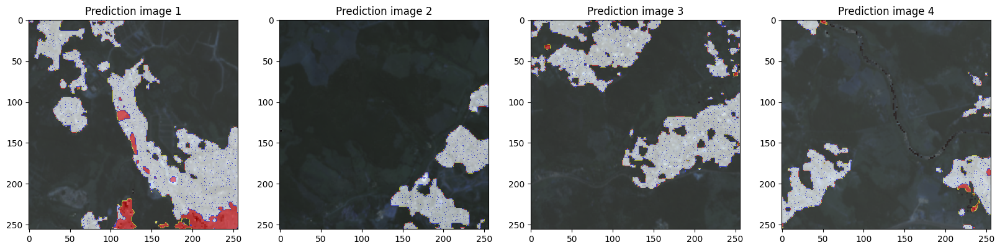

100%|██████████| 16/16 [00:04<00:00,  3.66it/s]


Val Loss: 0.9567595165603014, 0.9567595165603014, 0.8677204146677134
Val Accuracy: 0.9780755639076233
Val confusion matrix:


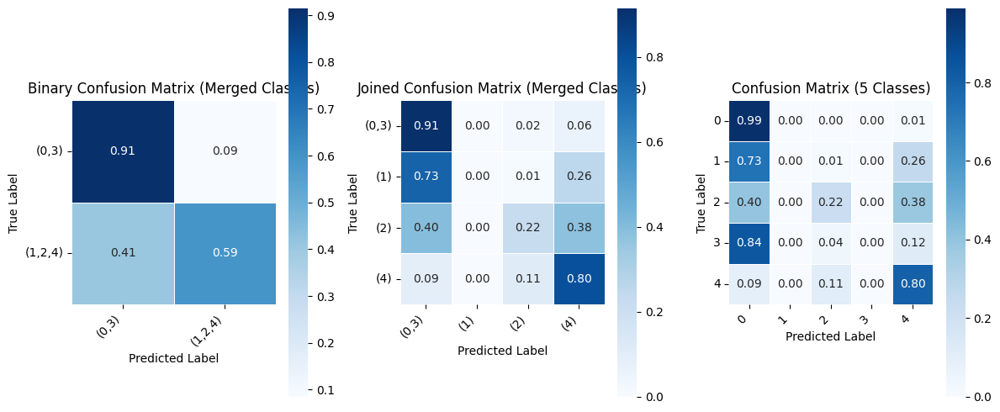

              precision    recall  f1-score   support          TP        FP  \
Class 0        0.971454  0.988736  0.980019  13012698  12866122.0  378069.0   
Class 1        0.000000  0.000000  0.000000     67159         0.0       0.0   
Class 2        0.026968  0.223580  0.048130     41001      9167.0  330760.0   
Class 3        0.000000  0.000000  0.000000     64228         0.0       0.0   
Class 4        0.930737  0.801387  0.861232   2871234   2300970.0  171232.0   
weighted avg   0.953812  0.945189  0.948378  16056320         0.0       0.0   
macro avg      0.385832  0.402741  0.377876  16056320         0.0       0.0   
micro avg      0.945189  0.945189  0.945189  16056320         0.0       0.0   

                      TN        FN  
Class 0        2665553.0  146576.0  
Class 1       15989161.0   67159.0  
Class 2       15684559.0   31834.0  
Class 3       15992092.0   64228.0  
Class 4       13013854.0  570264.0  
weighted avg         0.0       0.0  
macro avg            0.0     

  0%|          | 0/848 [00:00<?, ?it/s]

In [ ]:
for model_params in train.iterate_parameter_grid(model_param_grid):

    #definitions
    #if classes_mode == 'binary' and model_params['weighted_loss']: #duas classes, sem weighted loss
    #    continue

    
    model_name = model_params['model']
    training_batch_size = min(16, unet_models_batch[model_name])
    if model_params['crf']:
        model_name+='-crf'
    if model_params['dist_loss']:
        model_name+='-dist'
    model_name += f'-{model_params["loss"]}'
    if model_params['weighted_loss']:
        model_name+='W'
    patch_size = int(model_name.split('-')[1])
    print('--------------------')
    print('Training', model_name)
    print(model_params)
    model_class = model_name.split('-')[0]
    patch_size = int(model_name.split('-')[1])

    #load data

    yaml_filename = data.yaml_filename(num_subtiles, tiles, classes_mode)
    train_dataset = data.SubtileDataset(yaml_filename, 
                                    set = 'train_files',
                                    patch_size=patch_size, 
                                    stride=patch_size, 
                                    dynamic_sampling = model_params['data_augmentation'] ,
                                    data_augmentation = model_params['data_augmentation'], # testando 
                                    )
    
    val_dataset = data.SubtileDataset(yaml_filename, 
                                    set = 'val_files',
                                    patch_size=patch_size, 
                                    stride=patch_size, 
                                    dynamic_sampling = False,
                                    data_augmentation = False, # testando 
                                    )
    
    test_dataset = data.SubtileDataset(yaml_filename, 
                                    set = 'test_files',
                                    patch_size=patch_size, 
                                    stride=patch_size, 
                                    dynamic_sampling = False,
                                    data_augmentation = False, # testando 
                                    )

    if model_params['weighted_loss']:                   
        class_counts, per_image = train_dataset.count_classes()
        class_weights = 1.0 / class_counts  # Inverse of class frequencies
        class_weights = class_weights / torch.sum(class_weights)  # Normalize
    else:    
        class_weights = None

    train_loader = DataLoader(train_dataset, batch_size=training_batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=training_batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=training_batch_size, shuffle=False)

    if model_name.startswith('UNetSmall-'):
        model = unets.UNetSmall(in_channels=12, out_channels=num_classes, crf=model_params['crf'], use_dist = model_params['dist_loss']).to(device) 
    if model_name.startswith('UNet-'):
        model = unets.UNet(in_channels=12, out_channels=num_classes, crf=model_params['crf']).to(device) 
    elif model_name.startswith('UNetResNet34-'):
        model = unets.UNetResNet34(in_channels=12, out_channels=num_classes, crf=model_params['crf']).to(device) 
    elif model_name.startswith('UNetEfficientNetB0-'):
        model = unets.UNetEfficientNetB0(in_channels=12, out_channels=num_classes, crf=model_params['crf']).to(device) 
    elif model_name.startswith('UNetConvNext-'):
        model = unets.UNetConvNext (in_channels=12, out_channels=num_classes, crf=model_params['crf']).to(device) 
    elif model_name.startswith('HRNetW18'):
        model = hrnets.HRNetSegmentation(in_channels= 12, num_classes=num_classes, backbone="hrnet_w18_small", pretrained=True,).to(device)
    elif model_name.startswith('HRNetW32'):
        model = hrnets.HRNetSegmentation(in_channels= 12, num_classes=num_classes, backbone="hrnet_w32", pretrained=True,).to(device)
    elif model_name.startswith('HRNetW64'):
        model = hrnets.HRNetSegmentation(in_channels= 12, num_classes=num_classes, backbone="hrnet_w64", pretrained=True,).to(device)
        


    print(model_params['loss'])
    train.train_model(model, 
                        train_loader, 
                        val_loader, 
                        epochs=model_params['epochs'], 
                        loss_mode = model_params['loss'],
                        device = device,
                        num_classes = num_classes, 
                        simulated_batch_size = training_batch_size, #model_params['batch_size'] ,
                        patience = model_params['patience'],
                        weights = class_weights,
                        show_batches = 1, 
                        save_to = model_name+'.pth')
    try:
        train.test_model(model, 
                     checkpoint_path=model_name+'.pth',
                     dataloader = test_loader, 
                     device = device, 
                     num_classes = num_classes
                     ) 
                     #loss_mode = model_params['loss'], 
                     #simulated_batch_size = model_params['batch_size'] ,
                     #show_batches = 3,
                     #yield_predictions = True)
    except:
        print('ERROR IN TESTING')

    


In [ ]:
512 : 7 min
64:7 min

4: 8 min

training_batch_size

SyntaxError: illegal target for annotation (585771291.py, line 1)

In [ ]:

CE+dice:
w=false
Training Epoch 7/15
Running an epoch on the train mode.
100%|██████████| 544/544 [09:56<00:00,  1.10s/it]
Train Loss: 0.349927181981983
Train Accuracy: 0.989897608757019
              precision    recall  f1-score    support
Class 0        0.991026  0.983585  0.987292  674902656
Class 1        0.157359  0.546840  0.244392     785423
Class 2        0.521174  0.788182  0.627454    4100728
Class 3        0.000000  0.000000  0.000000      52980
Class 4        0.800652  0.827074  0.813648   32599334
weighted avg   0.978618  0.974744  0.976382  712441152
macro avg      0.494042  0.629136  0.534557  712441152
micro avg      0.974744  0.974744  0.974744  712441152
Running an epoch on the validation mode.
100%|██████████| 49/49 [00:22<00:00,  2.14it/s]
Val Loss: 0.37375469718660626
Val Accuracy: 0.9820711016654968
              precision    recall  f1-score   support
Class 0        0.982079  0.973579  0.977811  52610832
Class 1        0.152833  0.339461  0.210771    280816
Class 2        0.104010  0.238828  0.144911    176244
Class 3        0.000000  0.000000  0.000000    222594
Class 4        0.904626  0.913443  0.909013  10934828
weighted avg   0.959453  0.955178  0.957069  64225312
macro avg      0.428710  0.493062  0.448501  64225312
micro avg      0.955178  0.955178  0.955178  64225312


_____
dice wieghts false:
Running an epoch on the train mode.
100%|██████████| 544/544 [09:45<00:00,  1.08s/it]
Train Loss: 0.7087250603516267
Train Accuracy: 0.9880489110946655
              precision    recall  f1-score    support
Class 0        0.990842  0.979575  0.985177  674904320
Class 1        0.089860  0.378068  0.145207     785423
Class 2        0.425831  0.745641  0.542082    4100728
Class 3        0.000000  0.000000  0.000000      52980
Class 4        0.768330  0.818490  0.792617   32599328
weighted avg   0.976341  0.970122  0.972816  712442752
macro avg      0.454972  0.584355  0.493016  712442752
micro avg      0.970122  0.970122  0.970122  712442752
Running an epoch on the validation mode.
100%|██████████| 49/49 [00:22<00:00,  2.21it/s]
Val Loss: 0.7472342702807212
Val Accuracy: 0.9669278264045715
              precision    recall  f1-score   support
Class 0        0.984454  0.964939  0.974599  52610792
Class 1        0.123675  0.368661  0.185215    280816
Class 2        0.040027  0.708211  0.075771    176244
Class 3        0.000000  0.000000  0.000000    222594
Class 4        0.910202  0.724339  0.806703  10934828
weighted avg   0.962045  0.917320  0.936718  64225272
macro avg      0.411671  0.553230  0.408458  64225272
micro avg      0.917319  0.917319  0.917319  64225272
___________________

dice weights true

Running an epoch on the train mode.
100%|██████████| 544/544 [09:28<00:00,  1.05s/it]
Train Loss: 0.6986123358969767
Train Accuracy: 0.9902904033660889
              precision    recall  f1-score    support
Class 0        0.991317  0.984287  0.987789  674903680
Class 1        0.159925  0.540602  0.246830     785423
Class 2        0.553177  0.810664  0.657614    4100728
Class 3        0.000000  0.000000  0.000000      52980
Class 4        0.805124  0.831324  0.818014   32599382
weighted avg   0.979285  0.975726  0.977230  712442176
macro avg      0.501909  0.633375  0.542050  712442176
micro avg      0.975726  0.975726  0.975726  712442176
Running an epoch on the validation mode.
100%|██████████| 49/49 [00:21<00:00,  2.25it/s]
Val Loss: 0.7525374852881139
Val Accuracy: 0.9670466184616089
              precision    recall  f1-score   support
Class 0        0.981124  0.972790  0.976939  52610800
Class 1        0.084309  0.662758  0.149589    280816
Class 2        0.051314  0.632708  0.094930    176244
Class 3        0.000000  0.000000  0.000000    222594
Class 4        0.970905  0.681975  0.801187  10934828
weighted avg   0.969511  0.917617  0.937592  64225280
macro avg      0.417530  0.590046  0.404529  64225280
micro avg      0.917617  0.917617  0.917617  64225280

--------------------

BCE weighted

rain Loss: 0.5824577237555035
Train Accuracy: 0.9354603886604309
              precision    recall  f1-score    support
Class 0        0.997322  0.838913  0.911284  674903168
Class 1        0.013559  0.738981  0.026629     785423
Class 2        0.111748  0.899776  0.198806    4100728
Class 3        0.002531  0.360815  0.005026      52980
Class 4        0.440301  0.828709  0.575065   32599352
weighted avg   0.965578  0.838650  0.890756  712441664
macro avg      0.313092  0.733439  0.343362  712441664
micro avg      0.838651  0.838650  0.838650  712441664
Running an epoch on the validation mode.
100%|██████████| 49/49 [00:20<00:00,  2.38it/s]
Val Loss: 1.382897104535784
Val Accuracy: 0.956268310546875
              precision    recall  f1-score   support
Class 0        0.993868  0.892712  0.940578  52610784
Class 1        0.044371  0.630384  0.082906    280816
Class 2        0.065911  0.232263  0.102683    176244
Class 3        0.090386  0.370194  0.145296    222594
Class 4        0.868093  0.908741  0.887952  10934828
weighted avg   0.962624  0.890671  0.922812  64225264
macro avg      0.412526  0.606859  0.431883  64225264
micro avg      0.890671  0.890671  0.890671  64225264

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Example UNet model
class UNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(UNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=1)  # Output layer with num_classes channels
        )
    
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x  # Logits, raw outputs without activation

# Instantiate the model
in_channels = 12  # For your 12-channel input images
num_classes = 5   # For your 5 classes
model = UNet(in_channels, num_classes)

# Dummy input (batch_size=1, channels=12, height=256, width=256)
input_tensor = torch.randn(1, in_channels, 256, 256)

# Forward pass
logits = model(input_tensor)

# Apply softmax along the channel dimension (dim=1)
softmax_probs = F.softmax(logits, dim=1)  # Shape: [batch_size, num_classes, height, width]

# Output probabilities for each class at a specific pixel
pixel_probs = softmax_probs[0, :, 128, 128]  # Example: probabilities at pixel (128, 128)
print("Pixel probabilities:", pixel_probs)
print("Sum of probabilities:", pixel_probs.sum().item())  # Should be close to 1



In [ ]:
ims = []
for f in originals:
    with rasterio.open(f) as im:        
        #window = rasterio.windows.Window(x+subtile_x ,y+subtile_y , patch_size, patch_size) #TODO mudar esse hardcoded
        im = im.read()#window = window)
        im = im[1:4,:,:]
        im = im.transpose((1, 2, 0))
        im = np.clip(im, 0, 10000)
        im = im-np.min(im)
        im = im/np.max(im)
        ims.append(im)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

limx = (1000,1700)
limy = (1000,1700)
for im, mask in zip(ims, results):
    plt.figure(figsize=(10,10))
    plt.imshow(im[limx[0]:limx[1],limy[0]:limy[1],:])
    for c in range(5):
        plt.figure(figsize=(10,10))
        plt.imshow(mask[c,limx[0]:limx[1],limy[0]:limy[1]], cmap='gray')
    print(np.min(mask), np.max(mask), mask.shape)
    #plt.figure(figsize=(10,10))
    #plt.imshow(mask>0.5)




In [ ]:



import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def plot_satellite_with_mask(ax, satellite_image, mask, title="Satellite Image with Mask Overlay",
                             mask_color=(1, 0, 0), mask_alpha=0.5, border_color='red',
                             border_width=2):

    if satellite_image.shape[-1]!=3:
        satellite_image = satellite_image[1:4,:,:]
        satellite_image = satellite_image.transpose((1, 2, 0))
    # Ensure mask is binary
    mask = (mask > 0).astype(int)

    # Create a custom colormap for the mask
    colors = [(0, 0, 0, 0), mask_color + (mask_alpha,)]
    cmap = LinearSegmentedColormap.from_list("custom", colors, N=2)

    # Plot the satellite image
    ax.imshow(satellite_image)
    print(np.min(satellite_image))
    print(np.max(satellite_image))
    # Plot the mask overlay
    #mask_plot = ax.imshow(mask, cmap=cmap)

    # Plot the mask border
    #ax.contour(mask, colors=border_color, linewidths=border_width, levels=[0.5])

    # Set title and remove axis ticks
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

    return ax
    return mask_plot

def plot_multiple_satellite_images(satellite_images, masks, titles=None, figsize=(20, 20),
                                   mask_color=(1, 0, 0), mask_alpha=0.5, border_color='red',
                                   border_width=2):
    """
    Plot multiple satellite images with their corresponding masks in subplots.

    Parameters:
    satellite_images (list): List of satellite images (each a 3D numpy array)
    masks (list): List of corresponding masks (each a 2D numpy array)
    titles (list): List of titles for each subplot (optional)
    figsize (tuple): Figure size in inches (width, height)
    mask_color (tuple): RGB color for the mask (values between 0 and 1)
    mask_alpha (float): Alpha value for mask transparency (between 0 and 1)
    border_color (str or tuple): Color of the mask border
    border_width (float): Width of the mask border

    Returns:
    matplotlib.figure.Figure: The created figure
    """
    n = len(satellite_images)
    rows = int(np.ceil(np.sqrt(n)))
    cols = int(np.ceil(n / rows))

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if n == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, (image, mask) in enumerate(zip(satellite_images, masks)):
        if i < n:
            title = titles[i] if titles and i < len(titles) else f"Image {i+1}"
            mask_plot = plot_satellite_with_mask(axes[i], image, mask, title, 
                                                 mask_color, mask_alpha, 
                                                 border_color, border_width)
        else:
            axes[i].axis('off')

    # Add a colorbar to the last subplot
    cbar = fig.colorbar(mask_plot, ax=axes[-1], ticks=[0, 1])
    cbar.set_label('Mask Value')

    plt.tight_layout()
    return fig




In [ ]:
patches com 10% dos dados?
data aug so nas minoritarias
mostrar os erros
olhar o recall
salvar as mascaras para abrir no qgis.
aplicar só no setor censitario?



qual a saida do modelo? probabilidade de cada classes?
qual data augmentation vc fez?
qual as imagens vc ta usando? sentinel? resolucao?
como é a balanced accuracy?

0
loteamento vazio
outros equipamentos
vazio interubano
area urbanizada
